<a href="https://colab.research.google.com/github/Mmengyw/Capstone-Project/blob/main/AG_objectron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mediapipe

In [2]:
from google.colab import files
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

import mediapipe as mp
mp_objectron = mp.solutions.objectron
mp_drawing = mp.solutions.drawing_utils

Mediapipe Objectron provides pre-trained models for shoe, chair, cup and camera.

***
#Objectron Shoe Model

Upload any image that that has a person with visible upper body to the Colab. We take two examples image from the web: https://unsplash.com/photos/8dukMg99Hd8 and https://unsplash.com/photos/PqbL_mxmaUE

In [3]:

# Upload image files.
#uploaded = files.upload()

uploaded='/content/shoes1.jpg'
# Read images with OpenCV.
shoe_images = {name: cv2.imread(name) for name in uploaded.keys()}


# Preview the images.
for name, image in shoe_images.items():
  print(name)   
  cv2_imshow(image)

AttributeError: ignored

In [ ]:
with mp_objectron.Objectron(
    static_image_mode=True,
    max_num_objects=5,
    min_detection_confidence=0.5,
    model_name='Shoe') as objectron:
  # Run inference on shoe images.
  for name, image in shoe_images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Objectron.
    results = objectron.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw box landmarks.
    if not results.detected_objects:
      print(f'No box landmarks detected on {name}')
      continue
    print(f'Box landmarks of {name}:')
    annotated_image = image.copy()
    for detected_object in results.detected_objects:
      mp_drawing.draw_landmarks(
          annotated_image, detected_object.landmarks_2d, mp_objectron.BOX_CONNECTIONS)
      mp_drawing.draw_axis(annotated_image, detected_object.rotation, detected_object.translation)
    cv2_imshow(annotated_image)

***
#Python Solution API

Test using https://google.github.io/mediapipe/solutions/objectron#python-solution-api

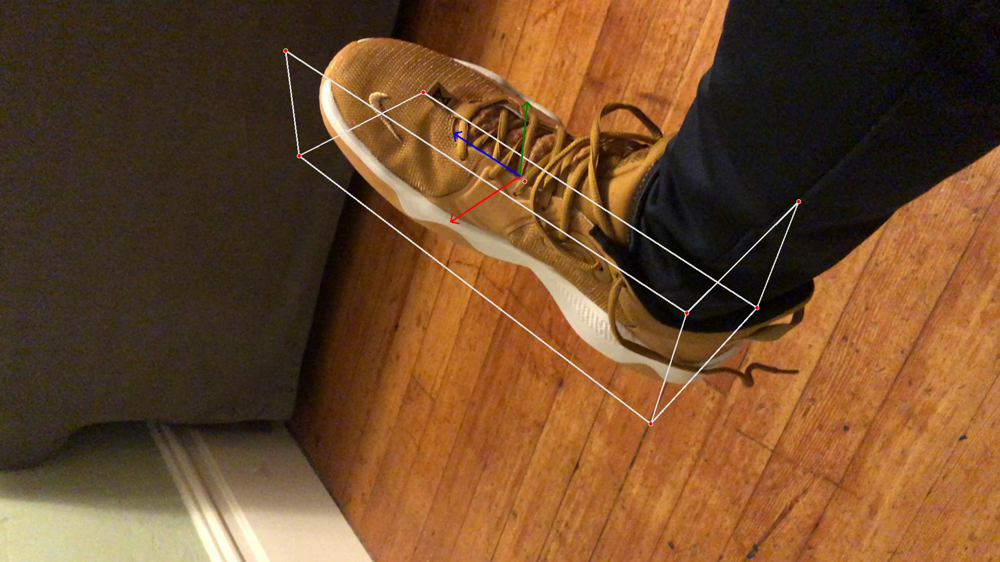

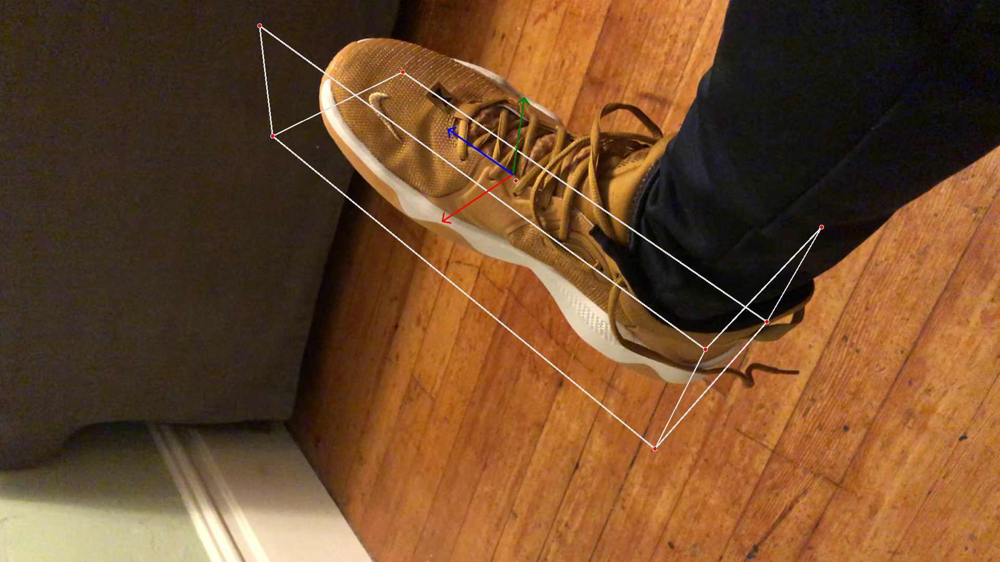

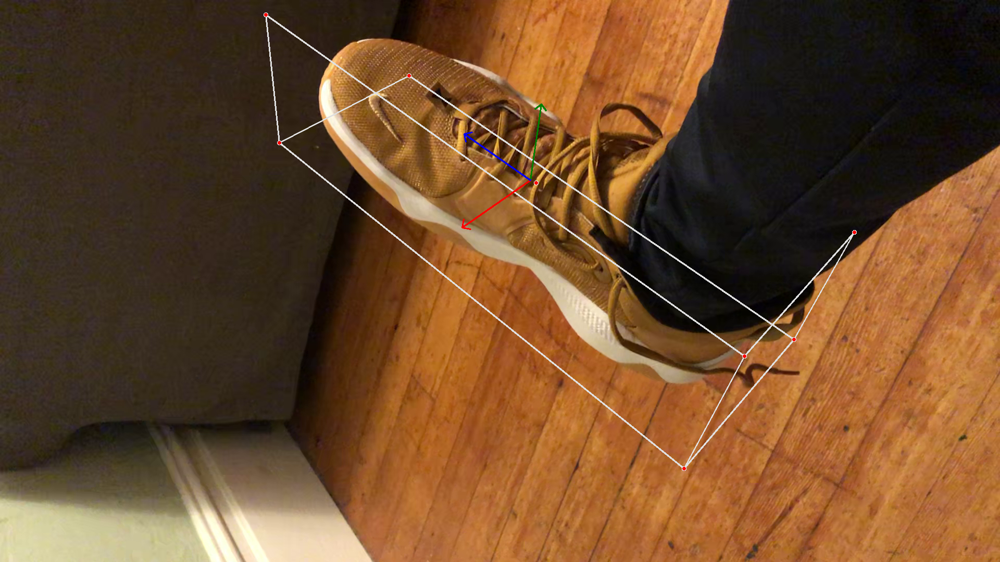

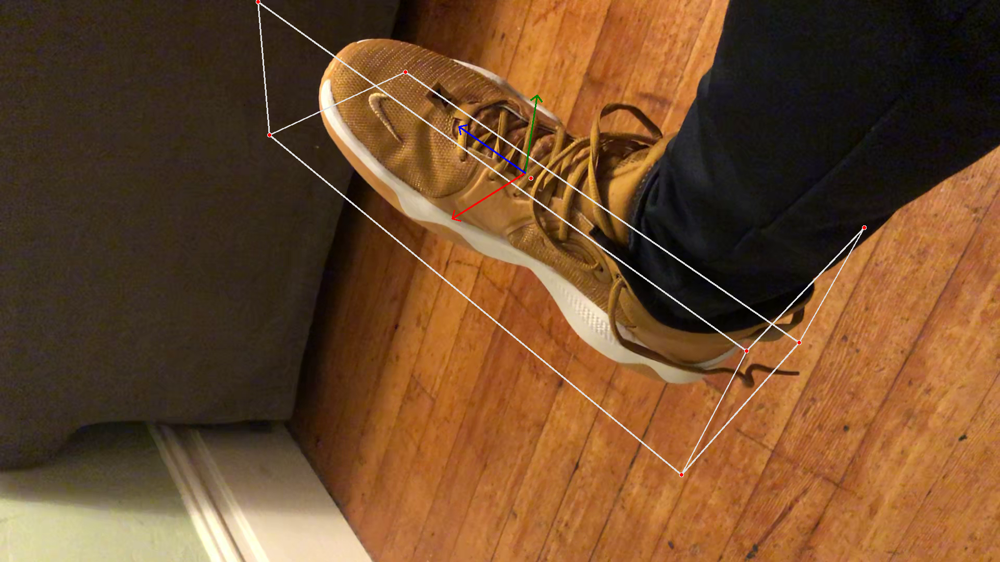

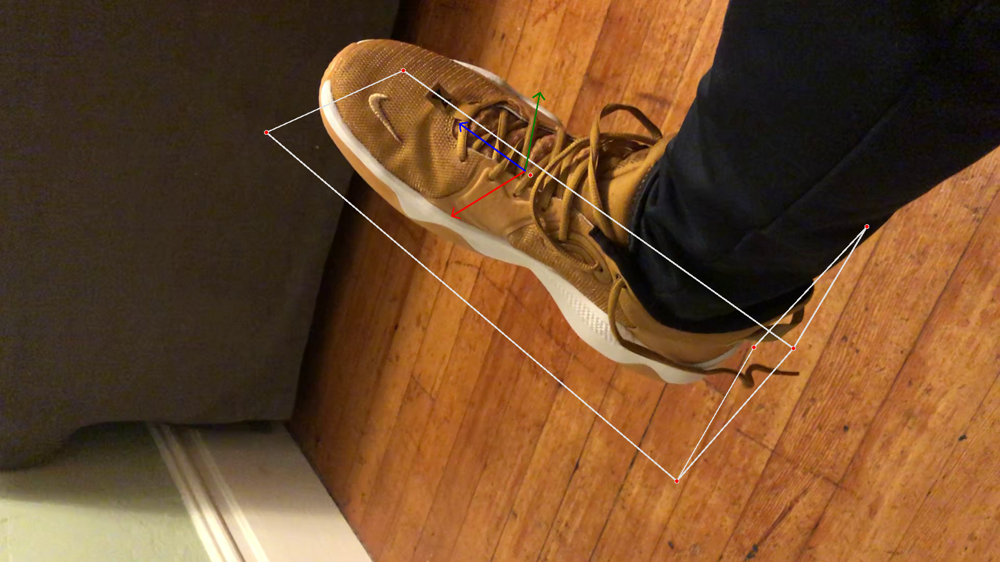

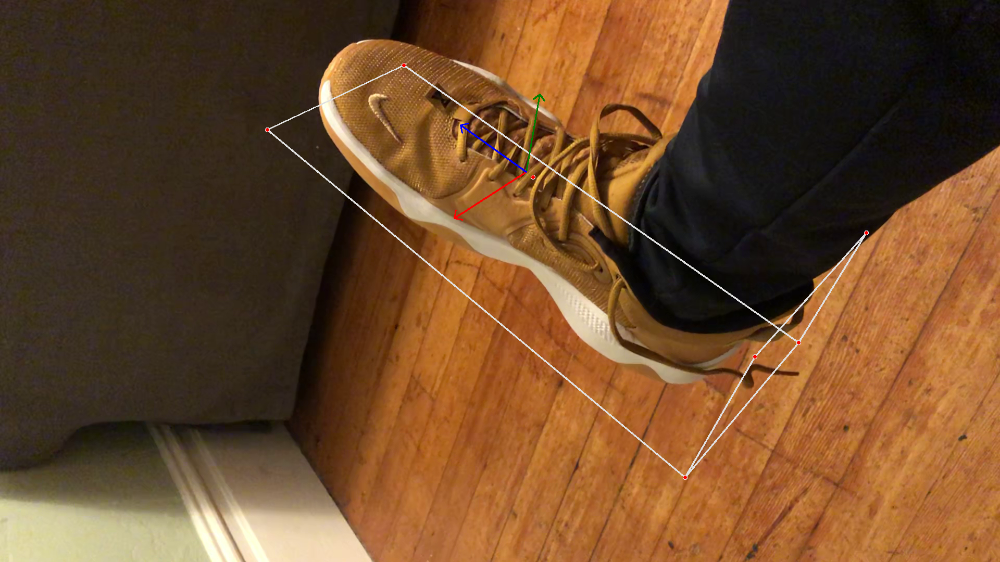

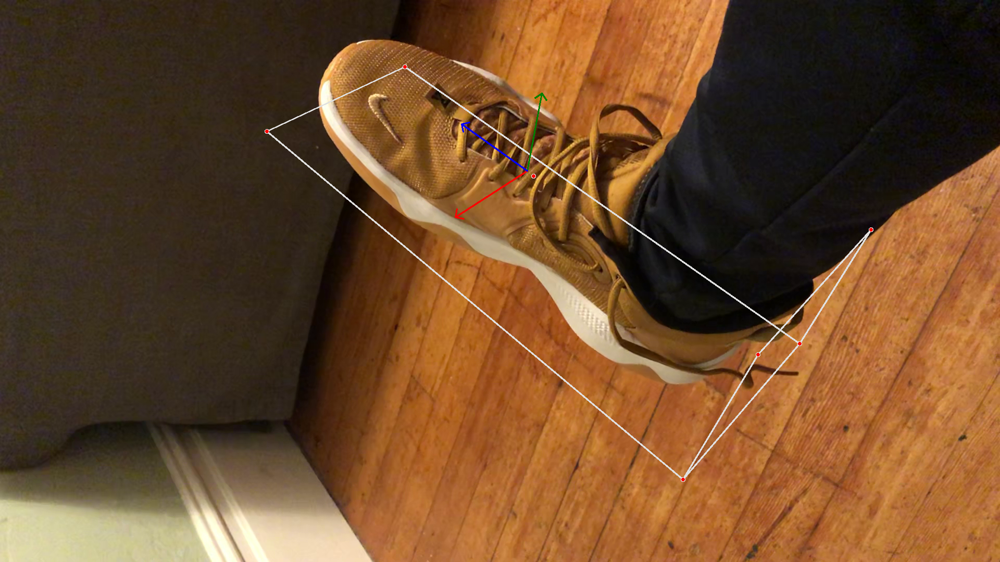

In [ ]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow

mp_drawing = mp.solutions.drawing_utils
mp_objectron = mp.solutions.objectron

#For static images:

# IMAGE_FILES = ['/content/shoes1.jpg']
# with mp_objectron.Objectron(static_image_mode=True,
#                             max_num_objects=12,
#                             min_detection_confidence=0.5,
#                             model_name='Shoe') as objectron:
#   for idx, file in enumerate(IMAGE_FILES):
#     image = cv2.imread(file)
#     # Convert the BGR image to RGB and process it with MediaPipe Objectron.
#     results = objectron.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

#     # Draw box landmarks.
#     if not results.detected_objects:
#       print(f'No box landmarks detected on {file}')
#       continue
#     print(f'Box landmarks of {file}:')
#     annotated_image = image.copy()
#     for detected_object in results.detected_objects:
#       mp_drawing.draw_landmarks(
#           annotated_image, detected_object.landmarks_2d, mp_objectron.BOX_CONNECTIONS)
#       mp_drawing.draw_axis(annotated_image, detected_object.rotation,
#                            detected_object.translation)
#       cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', annotated_image)
#     cv2_imshow(annotated_image)




    
# For webcam input:
cap = cv2.VideoCapture('/content/IMG_9445.MOV')
with mp_objectron.Objectron(static_image_mode=False,
                            max_num_objects=5,
                            min_detection_confidence=0.5,
                            min_tracking_confidence=0.99,
                            model_name='Shoe') as objectron:
  while cap.isOpened():
    success, image = cap.read()
    if not success:
      print("Ignoring empty camera frame.")
      continue

    # To improve performance, optionally mark the image as not writeable to
    # pass by reference.
    image.flags.writeable = False
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = objectron.process(image)

    # Draw the box landmarks on the image.
    image.flags.writeable = True
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    if results.detected_objects:
        for detected_object in results.detected_objects:
            mp_drawing.draw_landmarks(
              image, detected_object.landmarks_2d, mp_objectron.BOX_CONNECTIONS)
            mp_drawing.draw_axis(image, detected_object.rotation,
                                  detected_object.translation)
    # Flip the image horizontally for a selfie-view display.
    #cv2_imshow(cv2.flip(image, 1))
    cv2_imshow(image)
    # k = cv2.waitKey(0) & 0xFF
    # if k == 27:         # wait for ESC key to exit
    #   cv2.destroyAllWindows()
    if cv2.waitKey(5) & 0xFF == 27:
      break
cv2.destroyAllWindows()
cap.release()
